# Making accident predictions based on current data

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [18]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import MinMaxScaler

In [26]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix

In [4]:
df = pd.read_csv(r"C:\Users\mnilo\OneDrive\Desktop\Courses\Master Project\NM_na_filled_road_accidents.csv", low_memory=False).set_index("new_key_unique")
df

,accident_index,accident_reference,accident_severity,accident_year,age_band_of_casualty,age_band_of_driver,age_of_casualty,age_of_driver,age_of_vehicle,bus_or_coach_passenger,...,vehicle_direction_from,vehicle_direction_to,vehicle_leaving_carriageway,vehicle_left_hand_drive,vehicle_location_restricted_lane,vehicle_manoeuvre,vehicle_reference,vehicle_type,weather_conditions,age_group
new_key_unique,,,,,,,,,,,,,,,,,,,,,
2016010000005_2_1,2016010000005,010000005,Slight,2016,21 - 25,21 - 25,23.0,23.0,4,Not a bus or coach passenger,...,West,East,Did not leave carriageway,No,On main c'way - not in restricted lane,Going ahead other,2,Motorcycle 50cc and under,Fine no high winds,19-30
2016010000006_1_1,2016010000006,010000006,Slight,2016,36 - 45,36 - 45,36.0,36.0,1,Not a bus or coach passenger,...,South East,North,Nearside,No,On main c'way - not in restricted lane,Going ahead other,1,Car,Fine no high winds,31-45
2016010000008_1_1,2016010000008,010000008,Slight,2016,21 - 25,21 - 25,24.0,24.0,5,Not a bus or coach passenger,...,North,North West,Did not leave carriageway,No,On main c'way - not in restricted lane,Going ahead other,1,Car,Fine no high winds,19-30
2016010000016_1_1,2016010000016,010000016,Slight,2016,56 - 65,46 - 55,59.0,55.0,7,Standing passenger,...,South East,North,Did not leave carriageway,No,On main c'way - not in restricted lane,Going ahead other,1,Bus or coach (17 or more pass seats),Fine no high winds,46-60
2016010000018_2_1,2016010000018,010000018,Slight,2016,26 - 35,26 - 35,28.0,28.0,-1,Not a bus or coach passenger,...,South East,North,Did not leave carriageway,No,On main c'way - not in restricted lane,Going ahead other,2,Pedal cycle,Fine no high winds,19-30
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020991027064_2_1,2020991027064,991027064,Serious,2020,11 - 15,11 - 15,11.0,11.0,-1,Not a bus or coach passenger,...,North,South East,Did not leave carriageway,No,On main c'way - not in restricted lane,Moving off,2,Pedal cycle,Fine no high winds,0-18
2020991029573_1_1,2020991029573,991029573,Slight,2020,56 - 65,36 - 45,63.0,39.0,7,Not a bus or coach passenger,...,South East,North,Did not leave carriageway,No,Cycleway or shared use footway (not part of m...,Reversing,1,Car,Fine no high winds,31-45
2020991030297_2_1,2020991030297,991030297,Serious,2020,36 - 45,36 - 45,38.0,38.0,2,Not a bus or coach passenger,...,South West,North East,Did not leave carriageway,No,On main c'way - not in restricted lane,Going ahead left-hand bend,2,Motorcycle over 500cc,Fine no high winds,31-45


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 781711 entries, 2016010000005_2_1 to 2020991032575_1_1
Data columns (total 76 columns):
 #   Column                                       Non-Null Count   Dtype  
---  ------                                       --------------   -----  
 0   accident_index                               781711 non-null  object 
 1   accident_reference                           781711 non-null  object 
 2   accident_severity                            781711 non-null  object 
 3   accident_year                                781711 non-null  int64  
 4   age_band_of_casualty                         781711 non-null  object 
 5   age_band_of_driver                           781711 non-null  object 
 6   age_of_casualty                              781711 non-null  float64
 7   age_of_driver                                781711 non-null  float64
 8   age_of_vehicle                               781711 non-null  int64  
 9   bus_or_coach_passenger               

In [16]:
# Filter and sort columns with missing values
missing_values = df.isnull().sum()
missing_columns = missing_values[missing_values > 0].sort_values(ascending=False)

print(missing_columns)

age_group    3
dtype: int64


In [14]:
df.isnull().sum()

accident_index          0
accident_reference      0
accident_severity       0
accident_year           0
age_band_of_casualty    0
                       ..
vehicle_manoeuvre       0
vehicle_reference       0
vehicle_type            0
weather_conditions      0
age_group               3
Length: 76, dtype: int64

In [22]:
df_merged = df

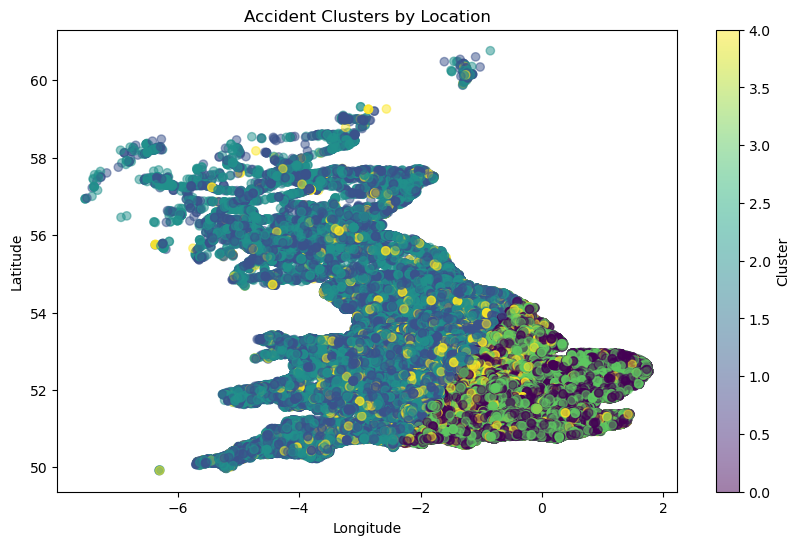

In [24]:
# Select clustering features
cluster_data = df_merged[['longitude', 'latitude', 'time']].dropna()

# Normalize data
scaler = MinMaxScaler()
cluster_data_scaled = scaler.fit_transform(cluster_data)

# Apply K-Means
kmeans = KMeans(n_clusters=5, random_state=42)
cluster_data['cluster'] = kmeans.fit_predict(cluster_data_scaled)

# Add cluster labels to the original dataset
df_merged['cluster'] = cluster_data['cluster']

# Plot clusters
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 6))
plt.scatter(cluster_data['longitude'], cluster_data['latitude'], c=cluster_data['cluster'], cmap='viridis', alpha=0.5)
plt.colorbar(label='Cluster')
plt.title('Accident Clusters by Location')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()

In [28]:
# Select features and target
features = df_merged[['age_of_driver', 'speed_limit', 'time', 'number_of_casualties']].dropna()
target = df_merged['casualty_severity']

# Encode target variable (if categorical)
target = target.map({'Slight': 0, 'Serious': 1, 'Fatal': 2})

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.3, random_state=42)

# Train Random Forest
rf = RandomForestClassifier(random_state=42)
rf.fit(X_train, y_train)

# Predictions
y_pred = rf.predict(X_test)

# Evaluation
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred))


Confusion Matrix:
 [[193713   2142    125]
 [ 34993    983     84]
 [  2280    140     54]]

Classification Report:
               precision    recall  f1-score   support

           0       0.84      0.99      0.91    195980
           1       0.30      0.03      0.05     36060
           2       0.21      0.02      0.04      2474

    accuracy                           0.83    234514
   macro avg       0.45      0.35      0.33    234514
weighted avg       0.75      0.83      0.77    234514



In [32]:
import folium
from folium.plugins import HeatMap

# Create base map
map_accidents = folium.Map(location=[df_merged['latitude'].mean(), df_merged['longitude'].mean()], zoom_start=6)

# Prepare data for heatmap
heat_data = df_merged[['latitude', 'longitude']].dropna().values

# Add HeatMap layer
HeatMap(heat_data).add_to(map_accidents)

# Save and display map
map_accidents.save("accident_heatmap.html")


In [34]:
from IPython.display import display
display(map_accidents)


In [ ]:
df_merged = df

In [40]:
df_merged['date']

new_key_unique
2016010000005_2_1    01/11/2016
2016010000006_1_1    01/11/2016
2016010000008_1_1    01/11/2016
2016010000016_1_1    01/11/2016
2016010000018_2_1    01/11/2016
                        ...    
2020991027064_2_1    12/08/2020
2020991029573_1_1    13/11/2020
2020991030297_2_1    15/04/2020
2020991030900_2_1    15/12/2020
2020991032575_1_1    25/08/2020
Name: date, Length: 781711, dtype: object

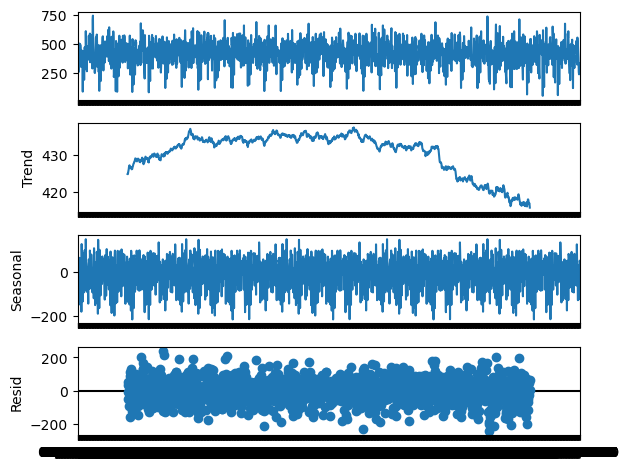

C:\Users\mnilo\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\mnilo\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\mnilo\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\mnilo\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\mnilo\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next versio

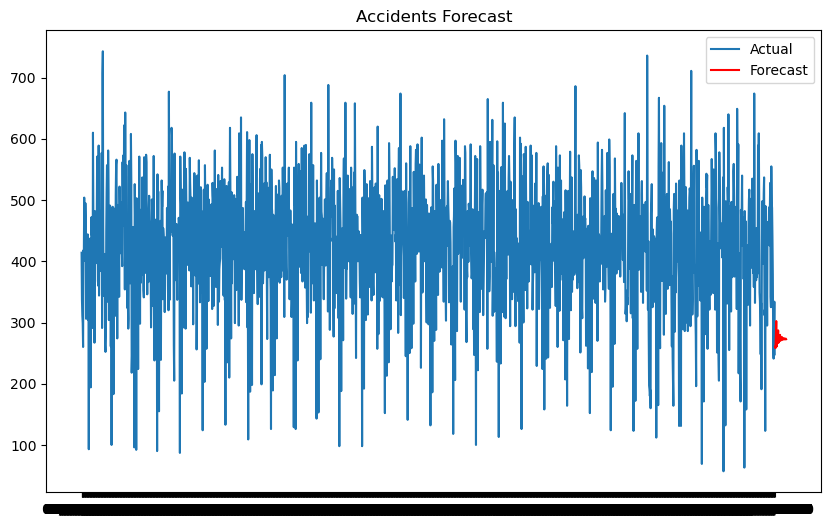

In [38]:
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.arima.model import ARIMA

# Group data by date
# df_merged['date'] = pd.to_datetime(df_merged['date'])
accidents_per_day = df_merged.groupby('date').size()

# Decompose time series
decomposition = seasonal_decompose(accidents_per_day, model='additive', period=365)
decomposition.plot()
plt.show()

# Train ARIMA model
model = ARIMA(accidents_per_day, order=(5, 1, 0))
arima_result = model.fit()

# Forecast
forecast = arima_result.forecast(steps=30)
plt.figure(figsize=(10, 6))
plt.plot(accidents_per_day, label='Actual')
plt.plot(forecast, label='Forecast', color='red')
plt.title('Accidents Forecast')
plt.legend()
plt.show()